# Case Study: Cat vs. Dog Image Classification

![ss](screenshot.png)


### **Proje Açıklaması:**
**Bu proje kapsamında, bir görüntünün kedi mi yoksa köpek mi olduğunu sınıflandırmak için keras kütüphanesinin functiona API'si class yapısı ile kullanılarak bir derin öğrenme modeli geliştirilmiştir. Geliştirilen model gradio kütüphanesi kullanılarak web application haline getirilmiştir.**

### **Veri Kümesi:**
**"Cat" ve "Dog" sınıflarına ait veri kümesi [kaggle'dan](https://www.kaggle.com/c/dogs-vs-cats/data) indirilmiştir.**

[Proje Github Reposu](https://github.com/kntvrl/cat_dog_classification_with_keras_funktional_api/)


In [62]:
import os
import shutil
from itertools import compress
import random 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import gradio as gr
from PIL import Image
import logging
from tqdm import tqdm
from scipy.cluster.vq import kmeans2
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score
from keras.src.legacy.preprocessing.image import ImageDataGenerator
from keras.api.applications.resnet import ResNet50,preprocess_input
from keras.api.preprocessing.image import load_img, img_to_array
from keras.api.preprocessing import image
from keras.src.saving import load_model
from keras.src.models import Model
from keras.src.layers import Conv2D, MaxPooling2D, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, Layer
from keras.src.callbacks import TensorBoard, ModelCheckpoint
from keras.src.optimizers import Adam
from keras import saving
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## 1. Veri Keşfi ve Ön İşleme

### 1.1 Veri kümesinin yüklenip ve görselleştirmesi

In [2]:
train_dir = 'data/train'  
train_cats_dir = os.path.join(train_dir, 'cat')
train_dogs_dir = os.path.join(train_dir, 'dog')

In [3]:

def show_images(images, title):
    plt.figure(figsize=(10, 5))
    for i, img_path in enumerate(images):
        img = load_img(img_path, target_size=(150, 150))
        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.title(f'{title} {i + 1}')
        plt.axis('off')
    plt.show()

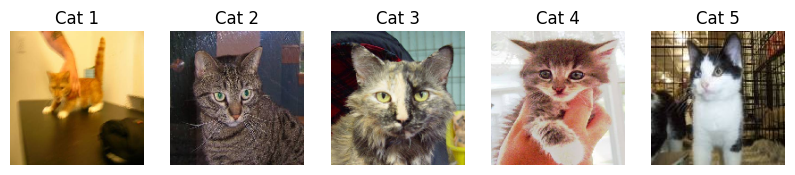

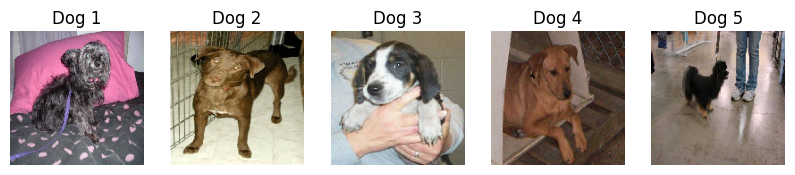

In [4]:
sample_cats_train = [os.path.join(train_cats_dir, fname) for fname in os.listdir(train_cats_dir)[:5]]
sample_dogs_train = [os.path.join(train_dogs_dir, fname) for fname in os.listdir(train_dogs_dir)[:5]]

show_images(sample_cats_train, 'Cat')
show_images(sample_dogs_train, 'Dog')

### 1.2 Görüntülerin boyutunu, renk kanallarını ve dağılımlarını analiz edilmesi

**Train ve Validation klasörlerindeki 12500 adet cat ve dog sınıfından resim bulunmaktadır.**

In [6]:
data_info = pd.DataFrame({
    "Category": ["Train Cats", "Train Dogs"],
    "Count": [len(os.listdir(train_cats_dir)), len(os.listdir(train_dogs_dir))]
})
data_info.head()

,Category,Count
0,Train Cats,12500
1,Train Dogs,12500


<Axes: xlabel='Category', ylabel='Count'>

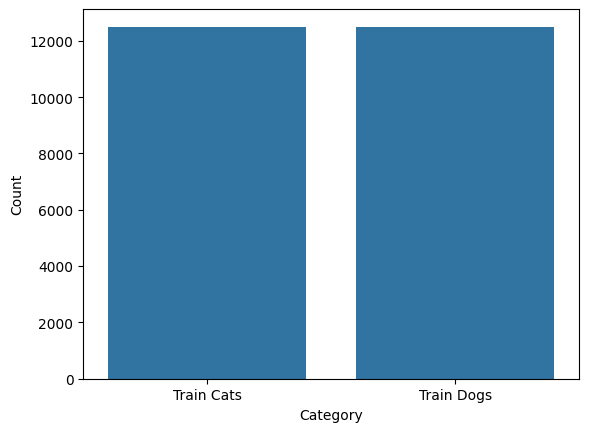

In [7]:
sns.barplot(data=data_info, x ="Category", y= "Count")

**Boyut ve renk kanalları analizi yapılarak ortalama genişlik ve yükseklik değerleri belirlenip, yeniden boyutlandırma için uygun genişlik ve yükseklik değerleri seçilmiştir.**

In [8]:
def compute_image_statistics(directory):
    widths = []
    heights = []
    channel_counts = []

    for file_name in os.listdir(directory):
        image_path = os.path.join(directory, file_name)
        image = load_img(image_path)
        image_array = img_to_array(image)
        
        width, height = image.size
        widths.append(width)
        heights.append(height)
        channel_counts.append(image_array.shape[2]) 

    avg_width = np.mean(widths)
    avg_height = np.mean(heights)
    avg_channels = np.mean(channel_counts)

    return avg_width, avg_height, avg_channels

In [9]:
avg_width_train_cats, avg_height_train_cats, avg_channels_train_cats = compute_image_statistics(train_cats_dir)
avg_width_train_dogs, avg_height_train_dogs, avg_channels_train_dogs = compute_image_statistics(train_dogs_dir)

print(f"Train Cats - Avg Width: {avg_width_train_cats:.2f}, Avg Height: {avg_height_train_cats:.2f}, Avg Channels: {avg_channels_train_cats:.2f}")
print(f"Train Dogs - Avg Width: {avg_width_train_dogs:.2f}, Avg Height: {avg_height_train_dogs:.2f}, Avg Channels: {avg_channels_train_dogs:.2f}")

Train Cats - Avg Width: 410.52, Avg Height: 356.47, Avg Channels: 3.00
Train Dogs - Avg Width: 397.68, Avg Height: 364.49, Avg Channels: 3.00


**Örnek bir resmin renk kanallarının görselleştirilmesi**

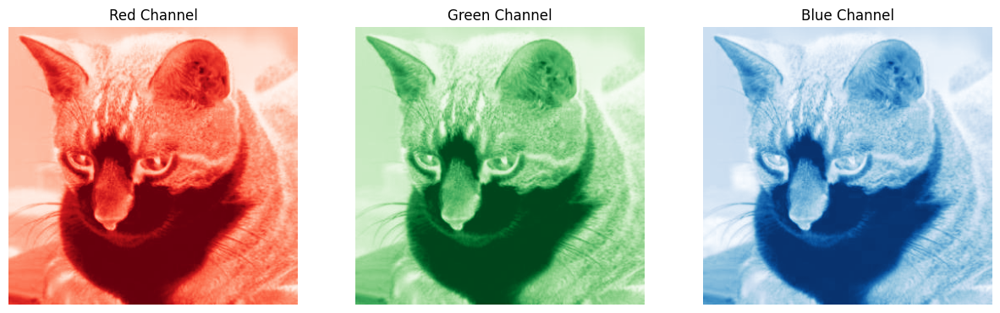

In [10]:
image_path = "data/train/cat/cat.38.jpg"  
image = Image.open(image_path)
r, g, b = image.split()
r_array = np.array(r)
g_array = np.array(g)
b_array = np.array(b)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(r_array, cmap="Reds")
axes[0].set_title("Red Channel")
axes[0].axis("off")

axes[1].imshow(g_array, cmap="Greens")
axes[1].set_title("Green Channel")
axes[1].axis("off")

axes[2].imshow(b_array, cmap="Blues")
axes[2].set_title("Blue Channel")
axes[2].axis("off")
plt.show()

### 1.3 Görüntüler üzerinde ön işleme adımlarını gerçekleştirilmesi.

- **Veri setinde çok sayıda resim olduğundan bu resimleri en iyi şekilde ayıklamak için ön işleme adımları gerçekleştirilmiştir.** 
- **Resizing, embedding, clustering, splitting, normalizasyon ve data augmentation işlemleri yapılmıştır. Kedi 0 , köpek 1 olarak etiketlenmiştir.**

**Yardımcı Fonksiyonları**

In [11]:
logging.basicConfig(
    level=logging.INFO, format= "%(asctime)s - %(levelname)s - %(message)s"
)

In [12]:
def check_is_dir(path):
    if not os.path.isdir(path):
        raise ValueError(f"Provided {path} is not a directory")
    return True

In [13]:
def filter_images(list_of_files):
    valid_extensions = {".jpg" , ".jpeg", ".png", ".webp"}
    return [file for file in list_of_files if any(file.endswith(ext) for ext in valid_extensions)]

In [14]:
def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return image

In [15]:
# main function
def read_images_from_dir(dir_path):

    check_is_dir(dir_path)
    files = os.listdir(dir_path)
    image_files = filter_images(files)
    image_paths = [os.path.join(dir_path, file) for file in image_files]
    images = [load_image(image_path) for image_path in tqdm(image_paths)]
    logging.info(f"Loaded {len(images)} from  {dir_path}")
    return images

**Okuma İşlemi**

In [16]:
loaded_images = read_images_from_dir("data/train/dog")

100%|██████████| 12500/12500 [00:27<00:00, 457.26it/s]
2024-08-30 08:47:52,889 - INFO - Loaded 12500 from  data/train/dog


**Resim yeniden boyutlandırma**

- **Veri setindeki resimlerin bazıları istediğimiz boyutdan çok büyük bazılarıda çok küçük olabilir. Bu nedenle küçük olanları atıp büyük olanları da en boy otanını koruyarak istediğimiz boyuta getiriyoruz.**

In [137]:
def max_resolution_rescale(image, max_width, max_height):

    width, height = image.size

    if width > max_width or height > max_height:
        ratio = min(max_width / width, max_height / height)
        new_width = int(width * ratio)
        new_height = int(height * ratio)
        image = image.resize((new_width, new_height), Image.LANCZOS)
    
    return image

**Resimlerin ortalama size değerlerine bakılarak max_size 350 olarak seçilmiştir.**

In [18]:
max_size = 350
resized_images = list(map(lambda x : max_resolution_rescale(x, max_size,max_size), tqdm(loaded_images)) )

100%|██████████| 12500/12500 [05:31<00:00, 37.69it/s] 


**İstediğimiz size değerinin altındaki resimleri de veri setinden çıkarıyoruz.**

In [19]:
def min_resolution_filter(image, min_width, min_height):
    width, height = image.size
    return width >= min_width and height >= min_height

In [20]:
min_size = 224
min_filtered_images = list(filter(lambda x : min_resolution_filter(x, min_size, min_size), tqdm(resized_images)) )

100%|██████████| 12500/12500 [00:00<00:00, 94236.40it/s]


In [21]:
len(min_filtered_images)

10514

**Cropping İşlemi**

- **Veriler farklı çözünürlüklerde farklı en boy genişliklerde, farklı aspect ratiolarda olabildiğinden bizim bunları standartlaştırmamız gerekiyor.**
- **Bu standartlaştırmayı yaparkende bunu maximum verim ile yapmamız gerekiyor. Yani fotoğrafları crop etme işlemini yaparken örneğin bir köpek resmin sağında yada solunda konumlanmış olabilir. Amaç köpeği ortalayıp resmi kesmektir.**
- **Bunun için smartcrop adında bir script kullanıldı.**

In [22]:
def plot_image(image):
    plt.imshow(image)
    plt.axis("off")
    plt.show()

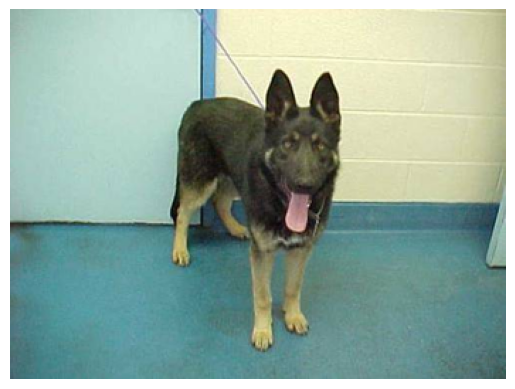

In [23]:
plot_image(min_filtered_images[100])

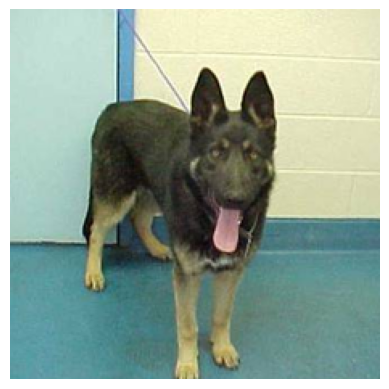

In [24]:
from smartcrop import detect
cropped_image = detect(min_filtered_images[100], square=True)
plot_image(cropped_image)

In [25]:
cropped_images = list(map(lambda x : detect(x, square=True), tqdm(min_filtered_images)))

100%|██████████| 10514/10514 [10:04<00:00, 17.40it/s]


**Ön işleme yapılan resimlerin diske kaydedilmesi**
- **Kedi ve köpek için işlemler baştan yapılır.**

In [26]:
def save_image(image, save_path):
    
    if isinstance(image, np.ndarray):
        image = Image.fromarray(image)
    if not isinstance(image,Image.Image):
        raise ValueError("Input image must be a numpy array or PIL image")
    if image.mode != "RGB":
        image = image.convert("RGB")
    image.save(save_path)
    logging.info(f"Saved image to {save_path}")

In [27]:
def create_directory(dir_path):
    
    if not os.path.isdir(dir_path):
        os.makedirs(dir_path)
        print(f"Directory created: {dir_path}")
    else:
        print(f"Directory already exist {dir_path}")

In [28]:
def save_images_to_dir(images, dir_path):
    create_directory(dir_path)
    check_is_dir(dir_path)

    for idx, image in tqdm(enumerate(images, 1)):
        save_path = os.path.join(dir_path, f"image_{idx}.png")
        save_image(image, save_path)
    return True

In [29]:
save_images_to_dir(cropped_images, "data/preprocessed_train/dog")

Directory created: data/preprocessed_train/dog


0it [00:00, ?it/s]2024-08-30 09:05:19,523 - INFO - Saved image to data/preprocessed_train/dog\image_1.png
1it [00:00,  1.03it/s]2024-08-30 09:05:19,879 - INFO - Saved image to data/preprocessed_train/dog\image_2.png
2024-08-30 09:05:19,947 - INFO - Saved image to data/preprocessed_train/dog\image_3.png
3it [00:01,  3.33it/s]2024-08-30 09:05:19,989 - INFO - Saved image to data/preprocessed_train/dog\image_4.png
2024-08-30 09:05:20,071 - INFO - Saved image to data/preprocessed_train/dog\image_5.png
5it [00:01,  5.64it/s]2024-08-30 09:05:20,092 - INFO - Saved image to data/preprocessed_train/dog\image_6.png
2024-08-30 09:05:20,120 - INFO - Saved image to data/preprocessed_train/dog\image_7.png
2024-08-30 09:05:20,142 - INFO - Saved image to data/preprocessed_train/dog\image_8.png
2024-08-30 09:05:20,171 - INFO - Saved image to data/preprocessed_train/dog\image_9.png
9it [00:01, 11.53it/s]2024-08-30 09:05:20,210 - INFO - Saved image to data/preprocessed_train/dog\image_10.png
2024-08-30 09

True

**Resim clustering işlemi**

- **Verilerde istenmeyen, modele uygun olmayan resimler karışabilir. Çok fazla sayıda resimi tek tek kontrol edip bunları ayıramayacağımızdan resimleri unsupervized learning teknikleri ile sınıflandırıp daha kolay bir şekilde bu resimleri veri setinden çıkarabiliriz.**
- **Bunu yapmak için ilk önce resimlerin embbeddinglerini çıkarmamız gerekir. Embedding çıkarmak için resnet50 modeli kullanılmıştır.**
- **Resnet50 modelinin son softmax katmanı çıkarılıp 2048 lik fully connected layerdaki embeddingler alınmıştır. Yani Aktivasyon fonksiyonundan geçen z = W.A + b değerleri.**
- **Embeddings vektorlerinin boyutu 2048 olduğundan bu vectorlerin boyutunu indirgememiz gereklidir. Boyutları ne kadar düşürürsek clustering yapabilmek için veriler o kadar uygun hale gelir.**
- **Boyut indirgeme işlemi için PCA kullanılmıştır.**
- **PCA ve Kmeans öncesi standardizasyon işlemi yapmak gerekir. Fakat burda verilerimiz zaten resnetten belirli bir standartda geldiğinden ilave standardizasyon yapılmamıştır.**
- **Yapılan clustering işlemi neticesinde kullanılmayacak yapıda resim tespit edilememiştir. (örn: çizgi karakter).**

In [33]:
def get_images_from_dir(dir_path):
    check_is_dir(dir_path)
    files = os.listdir(dir_path)
    image_files = filter_images(files)
    image_paths = [os.path.join(dir_path, file) for file in image_files]
    return image_paths

In [48]:
class Img2VecKeras:
    def __init__(self):

        base_model = ResNet50(weights='imagenet')
        self.model = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)
    
    def get_vec(self, img_paths):
        embeddings = []
        for img_path in tqdm(img_paths, desc="Extracting Embeddings", unit="image"):
            img = load_image(img_path) 
            img = img.resize((224, 224)) 
            img = image.img_to_array(img)  
            img = np.expand_dims(img, axis=0)  
            img = preprocess_input(img)  
            embedding = self.model.predict(img, verbose=0)  
            embeddings.append(embedding.flatten()) 
        return np.array(embeddings)

paths = get_images_from_dir("data/preprocessed_train/dog")

img2vec_keras = Img2VecKeras()
embeddings = img2vec_keras.get_vec(paths)

print(embeddings.shape)

df = pd.DataFrame(embeddings)
df["filepaths"] = paths
df.to_csv("data/embeddings/dog_embeddings.csv", index=False)

Extracting Embeddings: 100%|██████████| 10514/10514 [1:03:31<00:00,  2.76image/s]


(10514, 2048)


In [50]:
def calculate_pca(embeddings, dim=16):
    
    print("Calculating PCA")
    pca = PCA(n_components=dim)
    pca_embeddings = pca.fit_transform(embeddings.squeeze())
    print("PCA calculatin done!")
    return pca_embeddings

In [51]:
def calculate_kmeans(embeddings, k):
    print("Kmeans processing...")
    centroid, labels = kmeans2(data=embeddings, k=k, minit="points")
    counts = np.bincount(labels)
    print("Kmeans done!")
    return centroid, labels

In [52]:
def load_embeddings(file_path):
    embeddings = pd.read_csv(file_path)
    file_paths = embeddings["filepaths"]
    embeddings = embeddings.drop("filepaths", axis=1)
    return embeddings.values, file_paths

def create_dir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

In [58]:
embeddings, image_paths = load_embeddings("./data/embeddings/dog_embeddings.csv")
pca_dim = 16
cluster_range = 4

**Kedi ve köpek için bu yapı çalıştırılmıştır.**

In [59]:
project_name = "dog"

In [60]:
pca_embeddings = calculate_pca(embeddings=embeddings, dim=pca_dim)
centroid, labels = calculate_kmeans(pca_embeddings, k= cluster_range)

Calculating PCA
PCA calculatin done!
Kmeans processing...
Kmeans done!


In [61]:
for label_number in tqdm(range(cluster_range)):

    label_mask = labels == label_number
    path_images = list(compress(image_paths, label_mask))
    target_directory = f"data/clusters/{project_name}/cluster_{label_number}"
    create_dir(target_directory)
    for image_path in path_images:
        shutil.copy2(image_path, target_directory)

100%|██████████| 4/4 [00:15<00:00,  3.83s/it]


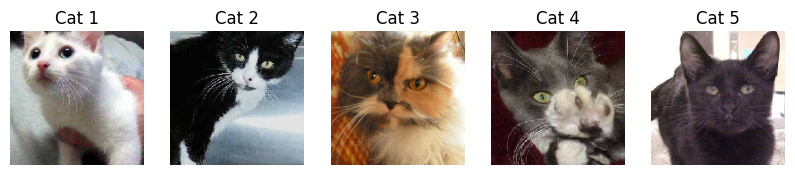

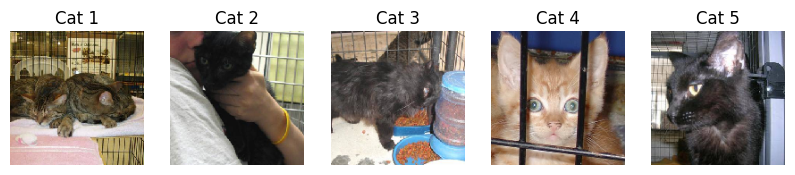

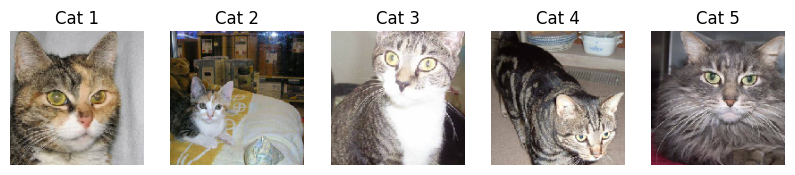

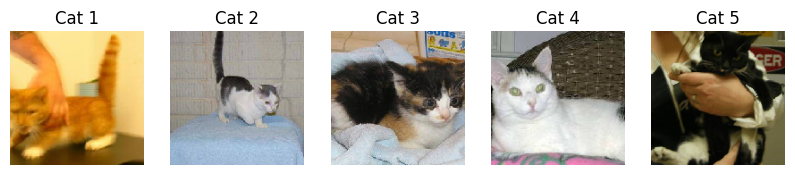

In [119]:
for i in range(4):
        cluster_cat_dir = f'data/clusters/cat/cluster_{i}' 
        cluster_cat_files = os.listdir(cluster_cat_dir)
        cluster_images_to_show_cat = [os.path.join(cluster_cat_dir, img_file) for img_file in cluster_cat_files[:5]]
        show_images(cluster_images_to_show_cat, 'Cat')

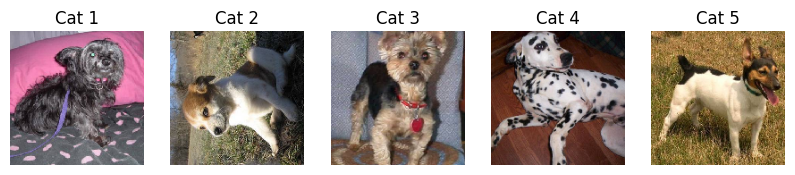

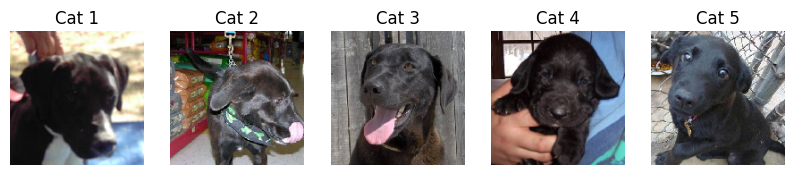

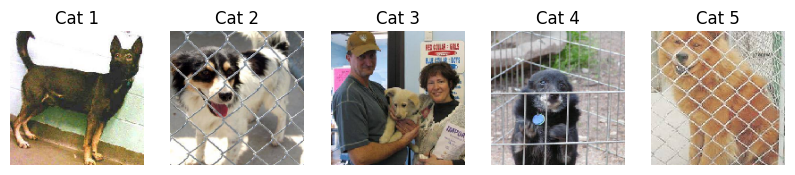

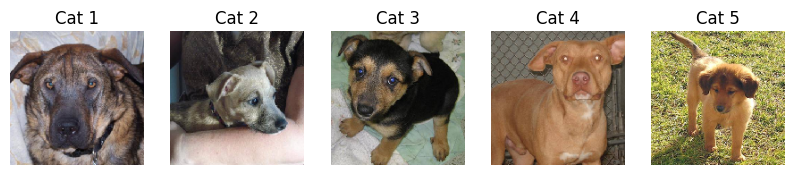

In [121]:
for i in range(4):
        cluster_dog_dir = f'data/clusters/dog/cluster_{i}' 
        cluster_dog_files = os.listdir(cluster_dog_dir)
        cluster_images_to_show_dog = [os.path.join(cluster_dog_dir, img_file) for img_file in cluster_dog_files[:5]]
        show_images(cluster_images_to_show_dog, 'Cat')

**Train datasını train ve validation olarak bölünmesi**
- **Model eğitiminde validasyon amaçlı kullanmak için veri setinin %10 bir kısmı validasyon set olarak ayrılmıştır. Model değerlendirme test verisi ile yapılacaktır.**

In [76]:
dataset_path = r"data/preprocessed_train" 
train_path = "data/model_train_splitted/train"
validation_path = "data/model_train_splitted/validation"
split_ratio = 0.9

In [77]:
os.makedirs(train_path,exist_ok=True) 
os.makedirs(validation_path,exist_ok=True)

In [78]:
for class_folder in os.listdir(dataset_path): 

    class_path = os.path.join(dataset_path, class_folder)
    if not os.path.isdir(class_path):
        continue
    files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]

    random.shuffle(files)
    split_index = int(len(files) * split_ratio) 
    train_files = files[:split_index]
    test_files = files[split_index:]

    os.makedirs(os.path.join(train_path, class_folder), exist_ok=True)
    os.makedirs(os.path.join(validation_path, class_folder), exist_ok=True)

    for f in train_files:
        src_file = os.path.join(class_path, f)  
        dst_file = os.path.join(train_path, class_folder, f)
        shutil.copy2(src_file, dst_file)
        print(f"{src_file} file copied to {dst_file} directory.")

    for f in test_files:
        src_file = os.path.join(class_path, f) 
        dst_file = os.path.join(validation_path, class_folder, f)
        shutil.copy2(src_file, dst_file)
        print(f"{src_file} file copied to {dst_file} directory")

print("Dataset splitting has been complated.")

data/preprocessed_train\cat\image_3130.png file copied to data/model_train_splitted/train\cat\image_3130.png directory.
data/preprocessed_train\cat\image_5966.png file copied to data/model_train_splitted/train\cat\image_5966.png directory.
data/preprocessed_train\cat\image_6995.png file copied to data/model_train_splitted/train\cat\image_6995.png directory.
data/preprocessed_train\cat\image_5398.png file copied to data/model_train_splitted/train\cat\image_5398.png directory.
data/preprocessed_train\cat\image_648.png file copied to data/model_train_splitted/train\cat\image_648.png directory.
data/preprocessed_train\cat\image_10389.png file copied to data/model_train_splitted/train\cat\image_10389.png directory.
data/preprocessed_train\cat\image_5902.png file copied to data/model_train_splitted/train\cat\image_5902.png directory.
data/preprocessed_train\cat\image_2460.png file copied to data/model_train_splitted/train\cat\image_2460.png directory.
data/preprocessed_train\cat\image_4979.p

In [82]:
splitted_train_dir = 'data/model_train_splitted/train'  
splitted_validation_dir = 'data/model_train_splitted/validation'
splitted_train_cats_dir = os.path.join(splitted_train_dir, 'cat')
splitted_train_dogs_dir = os.path.join(splitted_train_dir, 'dog')
splitted_validation_cats_dir = os.path.join(splitted_validation_dir, 'cat')
splitted_validation_dogs_dir = os.path.join(splitted_validation_dir, 'dog')

**Temizlenen veriler neticesinde train ve validation dağılımları aşağıda verilmiştir.**

In [83]:
data_info_split = pd.DataFrame({
    "Category": ["Train Cats", "Train Dogs", "Validation Cats", "Validation Dogs"],
    "Count": [len(os.listdir(splitted_train_cats_dir)), len(os.listdir(splitted_train_dogs_dir)),len(os.listdir(splitted_validation_cats_dir)),len(os.listdir(splitted_validation_dogs_dir))]
})
data_info_split.head()

,Category,Count
0,Train Cats,9360
1,Train Dogs,9462
2,Validation Cats,1040
3,Validation Dogs,1052


<Axes: xlabel='Category', ylabel='Count'>

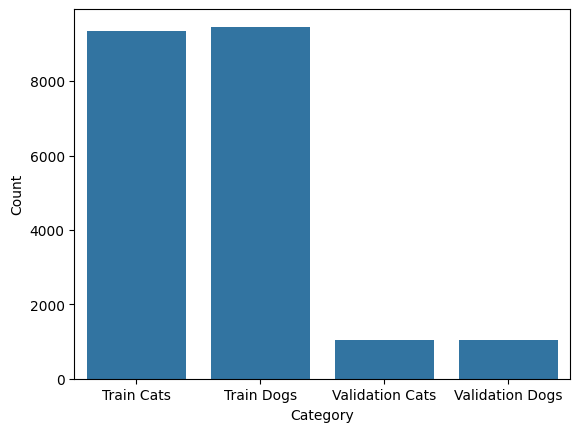

In [85]:
sns.barplot(data=data_info_split, x ="Category", y= "Count")

**Data augmentation işlemleri**

In [86]:

train_datagen = ImageDataGenerator(
    rescale=1./255,           # Normalization (0-255 to 0-1 range)
    rotation_range=40,        # random rotation 
    width_shift_range=0.2,    # random width shift
    height_shift_range=0.2,   # random height shift
    shear_range=0.2,          # random shear
    zoom_range=0.2,           # random zoom
    horizontal_flip=True,     
    fill_mode='nearest'       # fill method
)


val_datagen = ImageDataGenerator(rescale=1./255)  # only normalization for validation set

# load train images
train_generator = train_datagen.flow_from_directory(
    splitted_train_dir,
    target_size=(150, 150),  # resizing
    batch_size=32,
    class_mode='binary'      # binary classification (cat, dog)
)

# load validation images
validation_generator = val_datagen.flow_from_directory(
    splitted_validation_dir,
    target_size=(150, 150),  
    batch_size=32,
    class_mode='binary'   
)

class_indices = train_generator.class_indices
print("Class labels:", class_indices)

Found 18822 images belonging to 2 classes.
Found 2092 images belonging to 2 classes.
Class labels: {'cat': 0, 'dog': 1}


**Dönüşüm kontrolü**

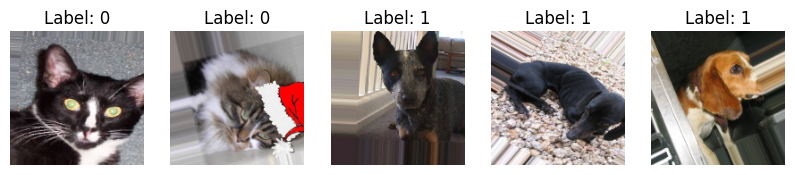

In [87]:
batch = next(train_generator)
images, labels = batch
num_images = min(5, len(images))

plt.figure(figsize=(10, 10))
for i in range(num_images):
    plt.subplot(1, 5, i + 1)
    plt.imshow(images[i]) 
    plt.title(f"Label: {int(labels[i])}")  
    plt.axis('off') 
plt.show()

## 2. Model Seçimi ve Eğitimi

Burada aşağıdaki görevler yerine getirilmiştir.

- Derin öğrenme modelinin seçilmesi
- Seçtilen modeli eğitmek için eğitim ve doğrulama veri setlerini kullanılması. Overfitting'i önlemek için dropout, batchnormalization, globalaveragepooling uygulanması
- Gerekli hiperparametrelerin belirlenmesi.


Derin öğrenme mimarisi olarak CNN (Convolutional Neural Network) kullanılacaktır. Burada resnet yada efficientnet gibi önceden eğitilmiş modellerin son katmanı eğitilerek transfer learning metodları da uygulanabilir. Bu case studyde sinir CNN model baştan oluşturulmuştur.

### Açıklamalar

**Class yapısı ile keras functional api kullanımı**
- Functional API, model yapılandırmasını daha detaylı ve esnek bir şekilde özelleştirme imkanı sunar. Bu, özellikle daha karmaşık ve özelleştirilmiş ağ yapıları oluştururken faydalıdır.
  
- Daha karmaşık modeller, çoklu giriş ve çıkış, paylaşılan katmanlar veya atlamalı bağlantılar gibi özellikler gerektirebilir. Functional API, bu tür yapıları yönetmek için gerekli esnekliği sağlar.
  
- Model tasarımında Functional API'yi kullanmak, daha karmaşık yapılarla çalışma deneyimi kazanmayı sağlar. Bu, gelecekte daha ileri seviye ağ yapıları geliştirirken el alışkanlığı kazanmayı sağlar. Bu şekilde, Sequential API ile sınırlı kalmadan daha geniş bir model yelpazesine hakim olunabilir.

**Model Yapısı**
- CNN (Convolutional Neural Network) yapısında genellikle birkaç evrişim (convolutional) katmanı kullanılır. Her bir Conv2D katmanı, görüntülerden daha karmaşık ve soyut özellikler çıkartır. İlk katmanlar daha temel özellikleri (kenar, köşe vb.) öğrenirken, daha derin katmanlar daha karmaşık ve yüksek seviyeli özellikleri öğrenir. Bu nedenle modelde 3 evrişim katmanı kullanarak, modelin daha zengin özellikler öğrenmesi hedeflenmiştir.
  
- Derin bir ağ, daha karmaşık ilişkileri öğrenebilir, fakat bu işlem daha fazla işlem gücü gerektirdiğinden bu projede 3 evrişim katmanı uygulanmıştır.

**Katmanların Açıklamaları**

- Conv2D: Evrişim katmanları, görüntülerdeki uzaysal ilişkileri öğrenir. 32, 64 ve 128 filtreler kullanarak her bir evrişim katmanının farklı seviyelerde özellikler öğrenmesi sağlanır.

- BatchNormalization: Bu, her bir batch'teki aktivasyonların normalizasyonunu sağlar. Bu, modelin eğitim sürecini stabilize eder ve öğrenme hızını artırabilir.

- MaxPooling2D: Bu katman, özellik haritalarının boyutlarını küçültür ve max değerler alındığından en önemli özellikleri korur. Modelin hesaplama yükünü azaltır ve daha yüksek seviyeli özelliklerin öğrenilmesine yardımcı olur.
  
- Dropout: Aşırı öğrenmeyi (overfitting) önlemek için kullanılır. Eğitim sırasında rastgele olarak bazı nöronları devre dışı bırakır, böylece modelin belirli nöronlara aşırı bağımlı olmasını engeller.
  
- GlobalAveragePooling2D: 2D özellik haritalarını her kanalın ortalamalarını alarak 1D vektörlere dönüştürür, parametre sayısını azaltılıp ve modelin aşırı öğrenmesini (overfitting) önleyebilir.
  
- Dense: Fully connected katmanlar, nöronlar arasındaki tüm bağlantıları kullanarak, yüksek seviyeli özellikleri öğrenir. Son katman sigmoid aktivasyon fonksiyonu ile, iki sınıflı (binary- cat, dog) sınıflandırma yapılır.

**Hiperparametreler ve Seçimleri**

- Filtre sayılarını artırarak derinleştirilmiş bir model yapısının kullanılması genellikle iyi bir pratik olarak kabul edildiğinden  3 katman için 32, 64, 128 seçilmiştir.
  
- Genellikle 0.20 ile 0.5 arasındaki değerler kullanılır. Daha yüksek değerler, modelin overfitting riskini azaltabilir ancak aşırı yüksek dropout oranları modelin performansını olumsuz etkileyebilir.

- Epoch sayısı, Eğitim sırasında modelin kaç kez eğitim verileri üzerinde çalıştırılacağını belirler. Deneme yanılma yolu ile ayarlanmıştır.

**Model Eğitimi ve İzleme**

- Modelcheckpoint, modelin her epoch'ta belirli bir dosya adına kaydedilmesini sağlar. save_best_only=True ile sadece en iyi performansa sahip modelin kaydedilmesi hedeflenmiştir.

- Tensorboard, Eğitim sırasında modelin performansını izlemek için kullanılır. TensorBoard callbacki eğitim ve doğrulama kayıplarını doğrulukları ve diğer metrikleri görselleştirir ve eğitim sürecinde modelin ne kadar iyi performans gösterdiğini ve hiperparametre ayarlarının etkilerini görmenizi sağlar.


**Daha moduler bir yapı için konvolusyon blocklarının oluşturulması**

In [88]:
class ConvBlock(Layer):
    def __init__(self, filters, kernel_size, dropout_rate, input_shape=None):
        super(ConvBlock, self).__init__()
        self.conv = Conv2D(filters, kernel_size, activation='relu', input_shape=input_shape)
        self.bn = BatchNormalization()
        self.pool = MaxPooling2D((2, 2))
        self.drop = Dropout(dropout_rate)

    def call(self, inputs, training=False):
        x = self.conv(inputs)
        x = self.bn(x, training=training)
        x = self.pool(x)
        x = self.drop(x, training=training)
        return x

class ConvBlock1(ConvBlock):
    def __init__(self, input_shape=None):
        super(ConvBlock1, self).__init__(32, (3, 3), dropout_rate=0.25, input_shape=input_shape)

class ConvBlock2(ConvBlock):
    def __init__(self):
        super(ConvBlock2, self).__init__(64, (3, 3), dropout_rate=0.25)

class ConvBlock3(ConvBlock):
    def __init__(self):
        super(ConvBlock3, self).__init__(128, (3, 3), dropout_rate=0.25)

**Model sınıfı oluşturulup keras'a kayıt edilmiştir.**

In [91]:

@saving.register_keras_serializable()
class CustomCNN(Model):
    def __init__(self, input_shape=(150, 150, 3), num_classes=1, name="custom_cnn", **kwargs):
        super(CustomCNN, self).__init__(name=name, **kwargs)
        self.num_classes = num_classes

        self.conv_block1 = ConvBlock1(input_shape=input_shape)
        self.conv_block2 = ConvBlock2()
        self.conv_block3 = ConvBlock3()

        self.global_avg_pool = GlobalAveragePooling2D()
        self.fc1 = Dense(512, activation='relu')
        self.drop4 = Dropout(0.5)
        self.fc2 = Dense(num_classes, activation='sigmoid')

    def call(self, inputs, training=False):
        x = self.conv_block1(inputs, training=training)
        x = self.conv_block2(x, training=training)
        x = self.conv_block3(x, training=training)
        
        x = self.global_avg_pool(x) 
        x = self.fc1(x)
        x = self.drop4(x, training=training)
        outputs = self.fc2(x)
        
        return outputs

    def get_config(self):
        config = super(CustomCNN, self).get_config()
        config.update({
            "input_shape": (150, 150, 3),
            "num_classes": self.num_classes
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

    def train(self, train_dir, val_dir, batch_size=32, epochs=10):
        # Data preprocessing
        train_datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest'
        )
        
        validation_datagen = ImageDataGenerator(rescale=1./255)
        
        train_generator = train_datagen.flow_from_directory(
            splitted_train_dir,
            target_size=(150, 150),
            batch_size=batch_size,
            class_mode='binary'
        )
        
        validation_generator = validation_datagen.flow_from_directory(
            splitted_validation_dir,
            target_size=(150, 150),
            batch_size=batch_size,
            class_mode='binary' 
        )
        
        # ModelCheckpoint callback
        checkpoint_callback = ModelCheckpoint(
            filepath='models/model_checkpoint_{epoch:02d}.keras',  
            monitor='val_loss',
            save_best_only=True,  
            save_weights_only=False,
            mode='min',
            verbose=1
        )
        
        # TensorBoard callback
        log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
        
        # Define learning rate
        optimizer = Adam(learning_rate=0.001)
        
        self.compile(optimizer=optimizer,
                     loss='binary_crossentropy',  # Binary classification loss function
                     metrics=['accuracy'])
        
        history = self.fit(
            train_generator,
            epochs=epochs,
            validation_data=validation_generator,
            callbacks=[checkpoint_callback, tensorboard_callback],
        )
        
        return history

In [92]:
model = CustomCNN(input_shape=(150, 150, 3), num_classes=1)

c:\Users\iskorpittt\Desktop\MY_DATA_SCIENCE\PROJECTS\kodlasam_cat_dog_project\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


**Model eğitimi**

In [94]:
model.train(train_dir=splitted_train_dir, val_dir=splitted_validation_dir, batch_size=32, epochs=50)

Found 18822 images belonging to 2 classes.
Found 2092 images belonging to 2 classes.
Epoch 1/50


c:\Users\iskorpittt\Desktop\MY_DATA_SCIENCE\PROJECTS\kodlasam_cat_dog_project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


589/589 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5998 - loss: 0.6761
Epoch 1: val_loss improved from inf to 1.08630, saving model to models/model_checkpoint_01.keras
589/589 ━━━━━━━━━━━━━━━━━━━━ 992s 2s/step - accuracy: 0.5998 - loss: 0.6760 - val_accuracy: 0.5163 - val_loss: 1.0863
Epoch 2/50
589/589 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6758 - loss: 0.6040
Epoch 2: val_loss improved from 1.08630 to 0.61241, saving model to models/model_checkpoint_02.keras
589/589 ━━━━━━━━━━━━━━━━━━━━ 703s 1s/step - accuracy: 0.6758 - loss: 0.6040 - val_accuracy: 0.6721 - val_loss: 0.6124
Epoch 3/50
589/589 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7105 - loss: 0.5629
Epoch 3: val_loss did not improve from 0.61241
589/589 ━━━━━━━━━━━━━━━━━━━━ 664s 1s/step - accuracy: 0.7105 - loss: 0.5629 - val_accuracy: 0.7122 - val_loss: 0.6160
Epoch 4/50
589/589 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7327 - loss: 0.5378
Epoch 4: val_loss did not improve from 0.61241
589/589 ━━━━━━━━━━━━━━━━━

In [95]:
model.summary()

Model: "custom_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_block1 (ConvBlock1)        │ ?                      │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_block2 (ConvBlock2)        │ ?                      │        18,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_block3 (ConvBlock3)        │ ?                      │        74,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 481,221 (1.84 MB)

 Trainable params: 160,257 (626.00 KB)

 Non-trainable params: 448 (1.75 KB)

 Optimizer params: 320,516 (1.22 MB)

- Globalmaxpooling sayesinde parametre sayısı 19 milyondan 481221'e inmiştir.
- Model seçimi için 44 numaralı epochda eğitilen model seçilmiştir(accuracy: 0.8895 - loss: 0.2499 - val_accuracy: 0.9202 - val_loss: 0.1900)

**Eğitim ve Validaston accuracy ve loss değerlerinin tensorboard ile görselleştirilmesi.**
- **Train ve validation için epoch accuracy artarken, epoch loss'daki azalmalar görülmektedir.**

In [98]:
%tensorboard --logdir logs/fit


Reusing TensorBoard on port 6006 (pid 8212), started 1 day, 13:11:11 ago. (Use '!kill 8212' to kill it.)

**Burada epoch sayısı artırılabilir**.

## 3. Model Değerlendirme

Burada aşağıdaki görevler yerine getirilmiştir.

- Eğitim tamamlandıktan sonra, modelin test seti üzerinde performansını değerlendirilmesi.
  
- Sınıflandırma doğruluğu, confusion matrix, accuracy, precision ve recall gibi metrikleri kullanarak modelin performansının analiz edilmesi.
  
- Modelin yanlış sınıflandırdığı örnekleri görselleştirerek hataların incelenmesi.

**Not: Buradaki test seti kaggle yarışması için hazırlandığından her bir test resmi için tahmin yapılıp etiketler submit edilecek şekilde yapılandırılmıştır. Test verisi cat, dog diye ayrı klasörler içinde olmadığından model performansını değerlendirmek için 2 seçenek vardır. Test verisindeki kedi ve kopek resimlerini tek tek cat, dog klasörlerine atmak. Diğer seçenekte performans değerlendirmesini validation seti üzerinden yapmak. Burada performans değerlendirmesi validation seti üzerinden yapılmıştır.**


**Test verileri uygun formata getirilip tahmin yapıldıktan sonra performans metrikleri hesaplanmıştır.**

**En iyi model seçilip yüklenmiştir.**

In [99]:
model = load_model("models/model_checkpoint_44.keras")

2024-08-30 23:52:53,440 - WARNING - From c:\Users\iskorpittt\Desktop\MY_DATA_SCIENCE\PROJECTS\kodlasam_cat_dog_project\venv\Lib\site-packages\keras\src\backend\tensorflow\core.py:204: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.



**prediction için resimler uygun formata getirilmiştir.**

In [122]:
validation_dir = "data/model_train_splitted/validation"

Found 2092 images belonging to 2 classes.
66/66 ━━━━━━━━━━━━━━━━━━━━ 28s 378ms/step
Accuracy: 0.9201720841300192
Precision: 0.9250720461095101
Recall: 0.9153992395437263


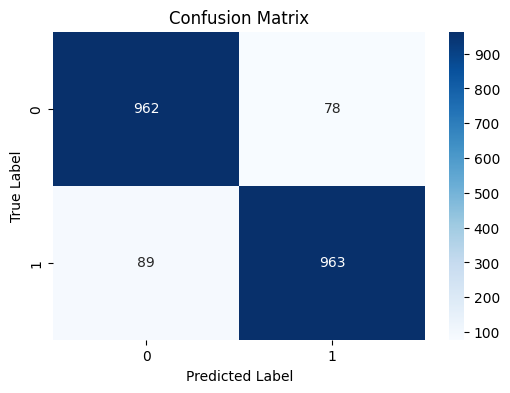

              precision    recall  f1-score   support

           0       0.92      0.93      0.92      1040
           1       0.93      0.92      0.92      1052

    accuracy                           0.92      2092
   macro avg       0.92      0.92      0.92      2092
weighted avg       0.92      0.92      0.92      2092



In [123]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    validation_dir, 
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    shuffle=False  
)

predictions = model.predict(test_generator)
predicted_classes = np.where(predictions > 0.5, 1, 0)

true_classes = test_generator.classes

# Performance mtrics
print("Accuracy:", accuracy_score(true_classes, predicted_classes))
print("Precision:", precision_score(true_classes, predicted_classes))
print("Recall:", recall_score(true_classes, predicted_classes))

# Confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.show()

# classification report
print(classification_report(true_classes, predicted_classes))

**Performans Metrikleri**
Bu sonuçlardan hesaplanan metrikler:

- Accuracy: Genel olarak modelin ne kadar doğru tahminde bulunduğunu gösterir.
- Precision: Pozitif sınıfın (köpek) model tarafından doğru tahmin edilme oranı.
- Recall: Gerçek pozitif sınıflardan model tarafından doğru tahmin edilen oran.
- F1 Score: Precision ve recall harmonik ortalaması.

**Confusion Matrix Analizi**

- True Negative (TN): Modelin doğru bir şekilde kedi olarak sınıflandırdığı kedi örneklerinin sayısı.
- False Negative (FN): Modelin köpek yerine kedi olarak sınıflandırdığı köpek örneklerinin sayısı.
- False Positive (FP): Modelin kedi yerine köpek olarak sınıflandırdığı kedi örneklerinin sayısı.
- True Positive (TP): Modelin doğru bir şekilde köpek olarak sınıflandırdığı köpek örneklerinin sayısı.

- TN = 962 (kedi olarak doğru sınıflandırılmış kedi örnekleri)
- FN = 89 (köpek olarak yanlış sınıflandırılmış kedi örnekleri)
- FP = 78 (kedi olarak yanlış sınıflandırılmış köpek örnekleri)
- TP = 963 (köpek olarak doğru sınıflandırılmış köpek örnekleri)

**Classification Report Analizi**

**Sınıf 0 (Kedi):**

Precision: 0.92
Kedi olarak tahmin edilen örneklerin %92'si gerçekten kedi. Bu, modelin kedileri tanımada ne kadar başarılı olduğunu gösterir.

Recall: 0.92
Gerçekten kedi olan örneklerin %92'ü model tarafından doğru bir şekilde kedi olarak tanınmış. Bu, modelin kedileri bulma yeteneğinin yüksek olduğunu gösterir.

F1-score: 0.92
Kediler için modelin genel performansının iyi olduğunu gösterir.

**Sınıf 1 (Köpek):**

Precision: 0.93
Köpek olarak tahmin edilen örneklerin %93'ü gerçekten köpek. Bu, modelin köpekleri tanımada oldukça başarılı olduğunu gösterir.

Recall: 0.92
Gerçekten köpek olan örneklerin %92'si model tarafından doğru bir şekilde köpek olarak tanınmıştır.

F1-score: 0.92
Köpekler için modelin genel performansının yeterli olduğunu gösterir.

**Yanlış sınıflandırılan örneklerin görselleştirilmesi**

Validation sette yanlış sınıflandırılan toplam 167 adet resim vardır

In [124]:
test_generator.reset 
df = pd.DataFrame({
    'filename':test_generator.filenames,
    'predict':predicted_classes[:,0],
    'y':test_generator.classes
})
misclassified = df[df['y']!=df['predict']]
print(f'Total misclassified images : {misclassified['y'].count()}')

Total misclassified images : 167


**Köpek olarak yanlış sınıflandırılan kedi resimleri**

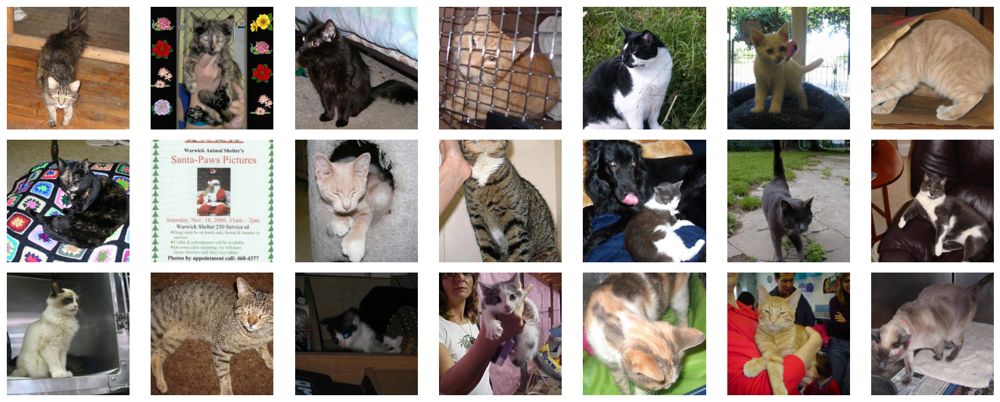

In [126]:
from keras.api.preprocessing import image

cat_as_dog = df['filename'][(df["y"] == 0) & (df["predict"] == 1)]

fig = plt.figure(figsize=(15, 6))
columns = 7
rows = 3
num_images = min(columns * rows, len(cat_as_dog))

for i in range(num_images):
    img_path = os.path.join('data/model_train_splitted/validation', cat_as_dog.iloc[i])
    
    if os.path.exists(img_path):
        img = image.load_img(img_path)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(img)
        plt.axis('off')
    else:
        print(f"Warning: File not found {img_path}")

plt.tight_layout()
plt.show()

**Kedi olarak yanlış sınıflandırılan köpek resimleri**

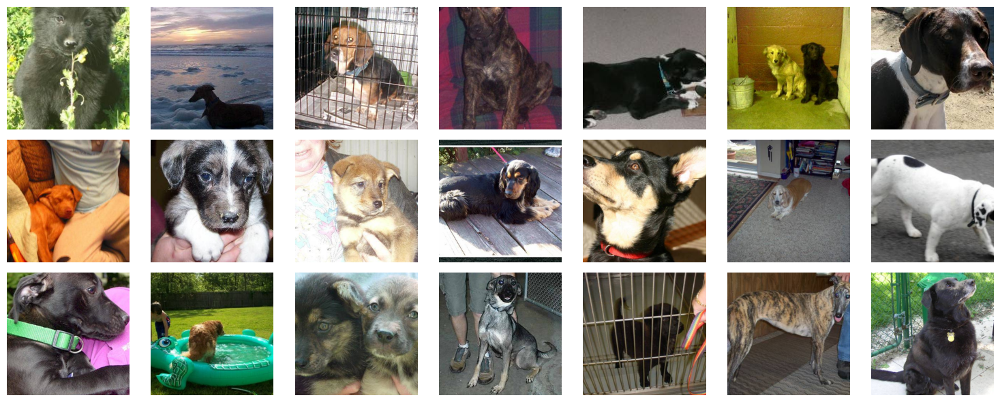

In [127]:
dog_as_cat = df['filename'][(df["y"] == 1) & (df["predict"] == 0)]

fig = plt.figure(figsize=(15, 6))
columns = 7
rows = 3
num_images = min(columns * rows, len(dog_as_cat))

for i in range(num_images):
    img_path = os.path.join('data/model_train_splitted/validation', dog_as_cat.iloc[i])
    
    if os.path.exists(img_path):
        img = image.load_img(img_path)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(img)
        plt.axis('off')
    else:
        print(f"Warning: File not found {img_path}")

plt.tight_layout()
plt.show()

### TAHMIN

**Test setinden manuel olarak resim seçim modelin başarısı denenmiştir. Siyah kedi ve köpeği iyi bir şekilde tahmin ettiği görülmektedir.**

In [130]:
test_dir = "data/test"

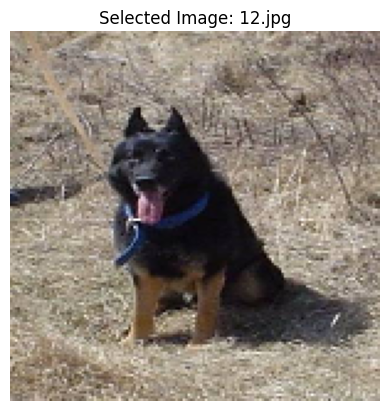

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted Label: Dog (Confidence: 1.00)


In [132]:
selected_image_path = os.path.join(test_dir, '12.jpg')
image = load_img(selected_image_path, target_size=(150, 150))
plt.imshow(image)
plt.title(f"Selected Image: {os.path.basename(selected_image_path)}")
plt.axis('off')
plt.show()

image_array = img_to_array(image) / 255.0
image_array = np.expand_dims(image_array, axis=0)

single_prediction = model.predict(image_array)

predicted_label = "Dog" if single_prediction > 0.5 else "Cat"
print(f"Predicted Label: {predicted_label} (Confidence: {single_prediction[0][0]:.2f})")

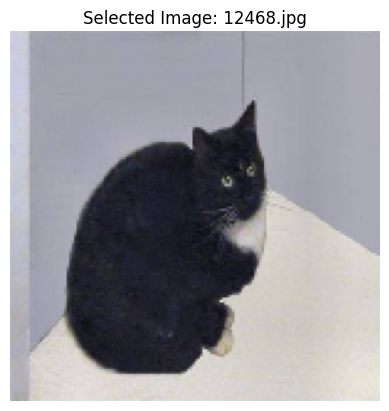

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Predicted Label: Cat (Confidence: 0.14)


In [135]:
selected_image_path = os.path.join(test_dir, '12468.jpg')
image = load_img(selected_image_path, target_size=(150, 150))
plt.imshow(image)
plt.title(f"Selected Image: {os.path.basename(selected_image_path)}")
plt.axis('off')
plt.show()

image_array = img_to_array(image) / 255.0
image_array = np.expand_dims(image_array, axis=0)

single_prediction = model.predict(image_array)

predicted_label = "Dog" if single_prediction > 0.5 else "Cat"
print(f"Predicted Label: {predicted_label} (Confidence: {single_prediction[0][0]:.2f})")

### WEB UYGULAMASI

**Uygulama için gradio kütüphanesi kullanılmıştır. Test setinden ve internetten resimler ile denenmiştir. Kedi ve Köpek sınıflarını yüksek oranda doğru bir şekilde ayırmaktadır.**

In [136]:
def predict(image):
 
    image = image.resize((150, 150))  
    image_array = img_to_array(image) / 255.0 
    image_array = np.expand_dims(image_array, axis=0) 
    single_prediction = model.predict(image_array)[0][0]
    predicted_label = "Dog" if single_prediction > 0.5 else "Cat"
    confidence = float(single_prediction) if single_prediction > 0.5 else float(1 - single_prediction)
    return predicted_label, confidence


interface = gr.Interface(
    fn=predict,  
    inputs=gr.Image(type="pil", label="Upload Image"),
    outputs=[gr.Textbox(label="Predicted Label"), gr.Number(label="Confidence")], 
    title="Dog vs Cat Classifier",  # Başlık
    description="Upload an image to classify it as Dog or Cat and see the confidence value." 
)

interface.launch()

2024-08-31 07:26:13,832 - INFO - HTTP Request: GET https://checkip.amazonaws.com/ "HTTP/1.1 200 "


Running on local URL:  http://127.0.0.1:7860


2024-08-31 07:26:14,390 - INFO - HTTP Request: GET https://api.gradio.app/pkg-version "HTTP/1.1 200 OK"
2024-08-31 07:26:14,742 - INFO - HTTP Request: GET http://127.0.0.1:7860/startup-events "HTTP/1.1 200 OK"
2024-08-31 07:26:16,490 - INFO - HTTP Request: HEAD http://127.0.0.1:7860/ "HTTP/1.1 200 OK"



To create a public link, set `share=True` in `launch()`.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
